In [9]:
from radd_demo import utils, vis, RADD
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from JSAnimation import IPython_display
from matplotlib import animation

# Load in Data

In [10]:
#replace with path to where you downloaded radd_demo repo
os.chdir('/Users/kyle/Dropbox/Git/')

fpath='radd_demo/demo/'

nogos=pd.read_csv(fpath+"pro_nogo.csv", index_col=0)
prort=pd.read_csv(fpath+"pro_rt.csv", index_col=0)

bsl_stops=pd.read_csv(fpath+"reB_stop.csv", index_col=0)
bsl_rt=pd.read_csv(fpath+"reB_rt.csv", index_col=0)

pnl_stops=pd.read_csv(fpath+"reC_stop.csv", index_col=0)
pnl_rt=pd.read_csv(fpath+"reC_rt.csv", index_col=0)

In [11]:
#Set some plotting parameters
sns.set_context('paper', font_scale=2)
clist = ['#22303d', '#434e57', '#bd4a4c', '#2980b9', '#009B76']

# Proactive

In [12]:
#mean 'no-go' decision curve
mean_nogo = nogos.mean().values
#plot 'no-go' decision curve
axp = vis.scurves([mean_nogo], task='Pro', sxdata=[nogos], colors=clist)

#RT(s) -> RT(ms)
mean_prort = prort.mean().values[1:]*1000
mean_prort_err = prort.sem().values[1:]*1.96*1000
#plot RTs
axrt = vis.prort(bars=mean_prort, berr=mean_prort_err, colors=clist)

# Reactive

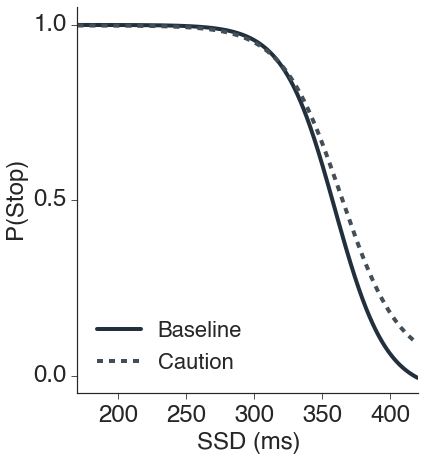

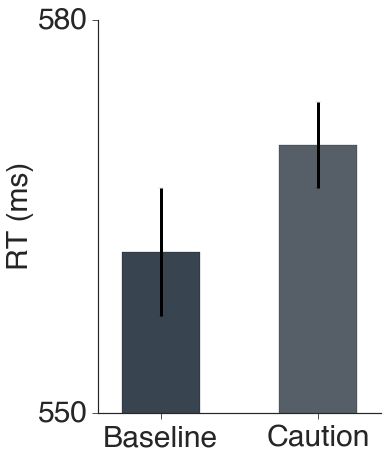

In [49]:
relabels=['Baseline', 'Caution']
lnstyl = ['-', '--']
stopacc = [stops_df.mean().values for stops_df in [bsl_stops, pnl_stops]]
stop_ax = vis.scurves(stopacc, task='Re', labels=relabels, linestyles=lnstyl, colors=clist)

mean_rert=[bsl_rt.mean()[0]*1000, pnl_rt.mean()[0]*1000]
mean_rert_err=[bsl_rt.sem()[0]*1000, pnl_rt.sem()[0]*1000]
rtax = vis.plot_re_bar(y=mean_rert, yerr=mean_rert_err, colors=clist)

# Read in parameter files

In [13]:
#read in proactive parameters to pandas df
protheta=pd.read_csv(fpath+"pro_theta.csv", index_col=0)
#convert to dictionary and extract all drift-rates to list
ptheta, vlist = utils.get_params_from_flatp(protheta)
#read in reactive parameters to pandas df & convert to dict
rtheta=pd.read_csv(fpath+"reB_theta.csv", index_col=0).to_dict()['mean']

# Animation of proactive conditions


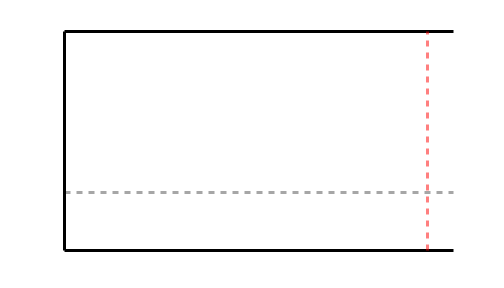
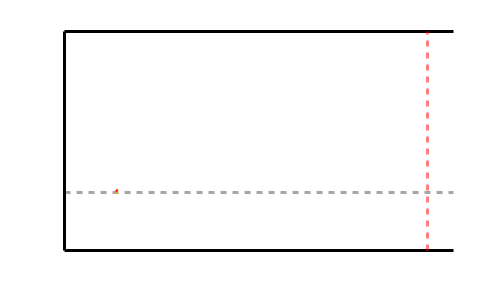
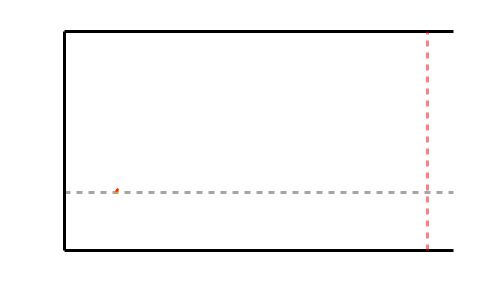
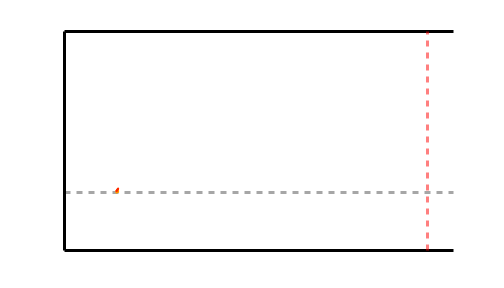
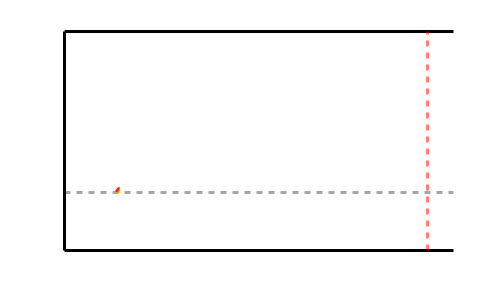
...
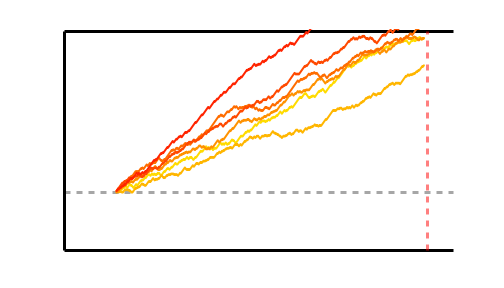
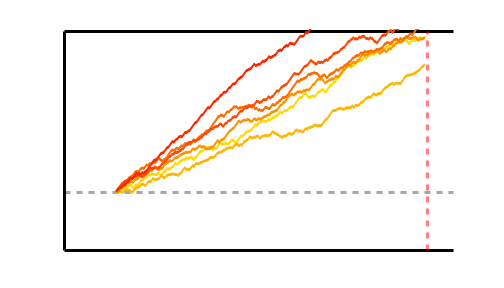
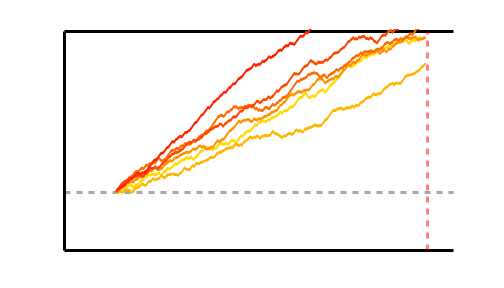
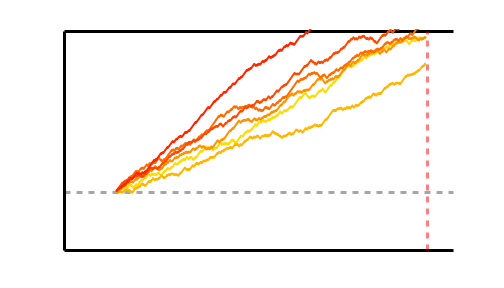
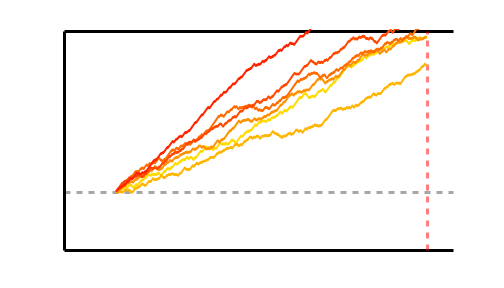

In [14]:
#simulate a single trial for each condition
protraces = vis.gen_pro_traces(ptheta, bias_vals=vlist, bias='v')
f, ax = vis.build_decision_axis(ptheta, protraces)
prolines = [ax.plot([], [], linewidth=2)[0] for n in protraces]
nframes = len(protraces[0])
x = np.arange(nframes)

# Red = Higher P(Go); Yellow = Lower P(Go)
animation.FuncAnimation(f, vis.pro_animate, fargs=(x, protraces, prolines), frames=nframes, interval=5, blit=True)

# Animation of Reactive conditions


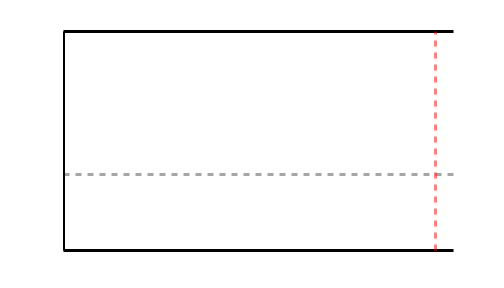
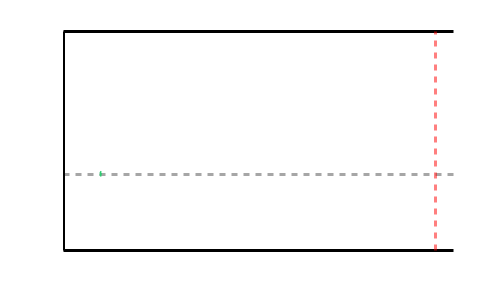
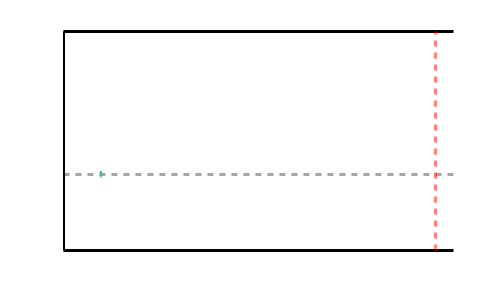
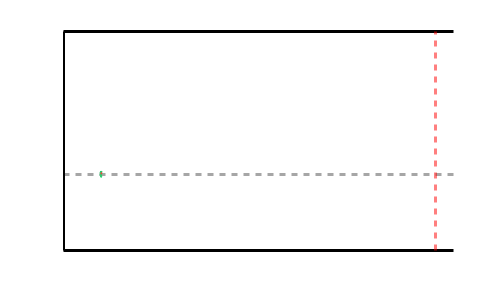
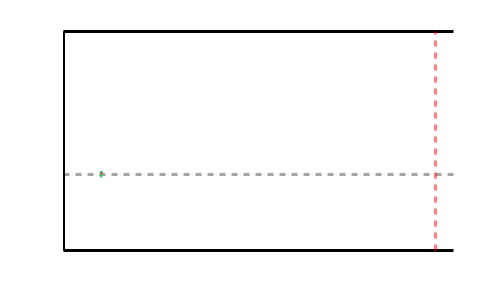
...
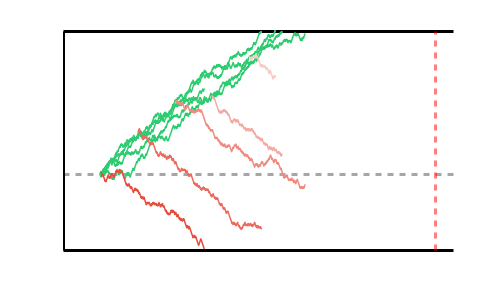
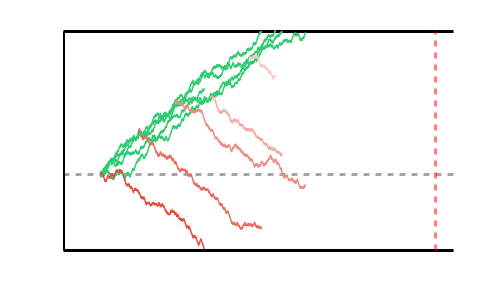
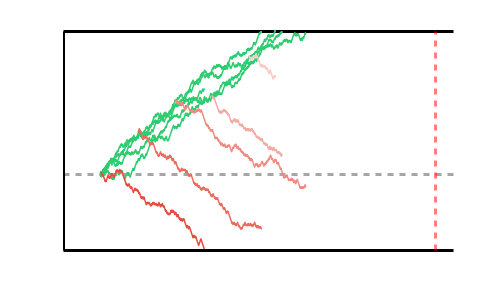
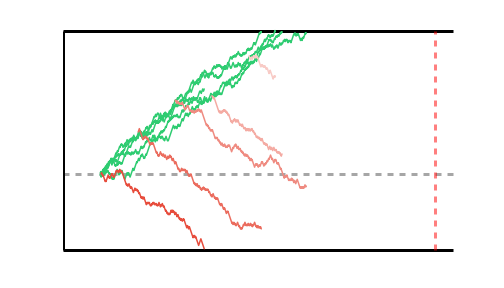
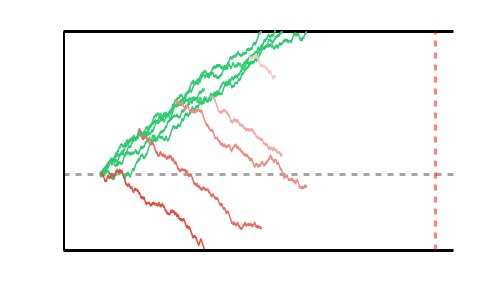

In [15]:
#simulate a single trial for each SSD
dvg_traces, dvs_traces, xi, yi = vis.gen_re_traces(rtheta)
f, ax = vis.build_decision_axis(rtheta, dvg_traces)
nframes = np.max([len(trace[trace<rtheta['a']]) for trace in dvg_traces])
x = np.arange(nframes)

dvg_lines = [ax.plot([], [], linewidth=1.5)[0] for n in dvg_traces]
dvs_lines = [ax.plot([xi[i]], [yi[i]], linewidth=1.5, color='r')[0] for i, n in enumerate(dvs_traces)]
nframes = np.max([len(trace[trace<rtheta['a']]) for trace in dvg_traces])

# Choice/RT dependency on SSD and variability in Go-NoGo process
animation.FuncAnimation(f, vis.re_animate, fargs=(x, dvg_traces, dvg_lines, dvs_traces, dvs_lines, rtheta, xi, yi), frames=nframes, interval=5, blit=True)

# Run simulations, compare observed vs. simulated data

## simulate effect of changing execution drift-rate in proactive task

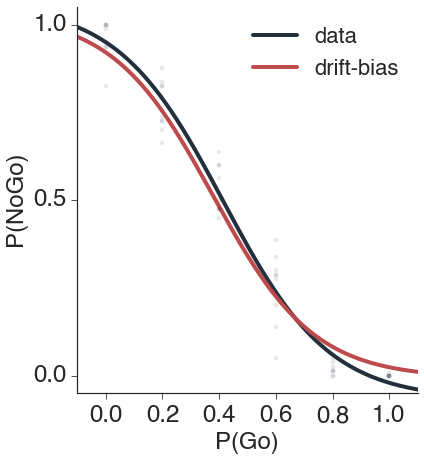

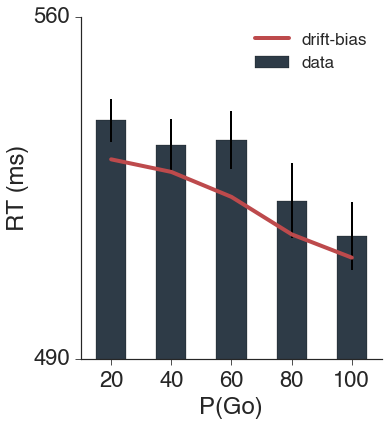

In [51]:
#simulate effect of changing execution drift-rate across Go trial probability
nogo_sim, prort_sim = fitpro.simple_prosim(ptheta, bias_vals=vlist, bias='v')

prolabels=['data', 'drift-bias']
prosim_colors=[clist[0], clist[2]]

axp = vis.scurves([mean_nogo, nogo_sim], task='Pro', sxdata=[nogos], colors=prosim_colors, labels=prolabels)
axrt = vis.prort(bars=mean_prort, berr=mean_prort_err, lines=[prort_sim], colors=prosim_colors, labels=prolabels)

###experiment with different parameter values
* v = drift-rate
* z = starting point
* a = boundary height
* t = onset time


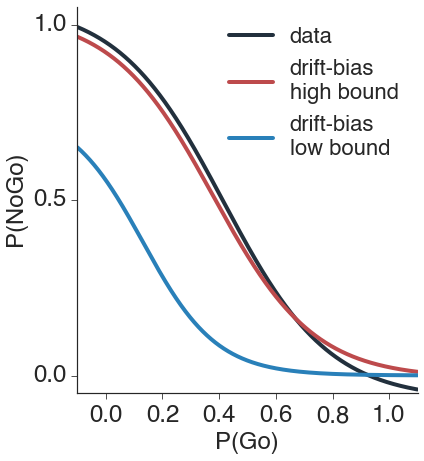

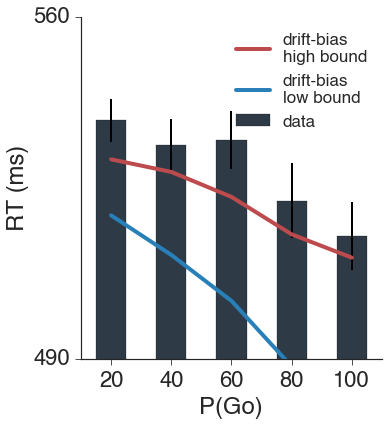

In [52]:
#make a copy of proactive parameters
exptheta = ptheta.copy()

# lower boundary height by 10%
exptheta['a'] = ptheta['a']*.9
nogo_sim2, prort_sim2 = fitpro.simple_prosim(exptheta, bias_vals=vlist, bias='v')

prolabels2=['data', 'drift-bias\nhigh bound', 'drift-bias\nlow bound']
prosim_colors2=[clist[0], clist[2], clist[3]]

axp = vis.scurves([mean_nogo, nogo_sim, nogo_sim2], task='Pro', labels=prolabels2, colors=prosim_colors2)
axrt = vis.prort(bars=mean_prort, berr=mean_prort_err, lines=[prort_sim, prort_sim2], labels=prolabels2, colors=prosim_colors2)

## simulate effect of changing SSD in reactive task

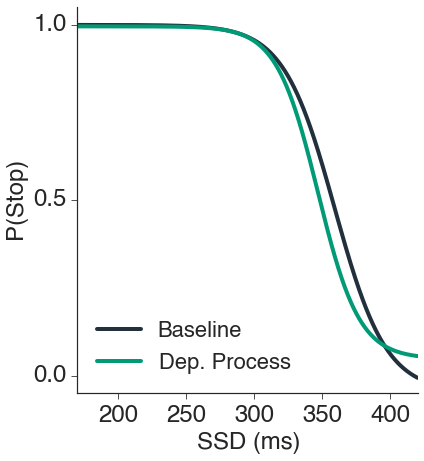

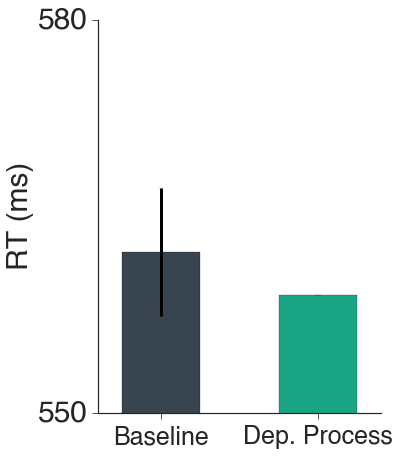

In [53]:
stop_sim, rert_sim = fitre.simple_resim(rtheta)

resim_labels=['Baseline', 'Dep. Process']
resim_colors = [clist[0], clist[-1]]

stop_ax = vis.scurves([stopacc[0], stop_sim], task='Re', labels=resim_labels, colors=resim_colors)
rtax = vis.plot_re_bar(y=[mean_rert[0], rert_sim], yerr=[mean_rert_err[0], 0], colors=resim_colors)
xtl = rtax.set_xticklabels(resim_labels, fontsize=25)

In [ ]:
def safd: